## STEPS FOR INSTALLING *fastai v2*.
\[DID NOT WORK\] Installation command from [docs.fast.ai](https://docs.fast.ai/)
```
conda install -c fastai -c pytorch -c anaconda fastai gh anaconda
```

\[DID NOT WORK - numpy installed through this has issues\] Installation command from [this article](https://medium.com/@pierre_guillou/how-to-install-fastai-v1-on-windows-10-ca1bc370dce4)
```
conda install fastai pytorch -c fastai -c pytorch -c conda-forge
```

### \[WORKING\] Install pytorch via conda and fastai via pip; Install ipywidgets also
```
conda install pytorch torchvision cudatoolkit=10.1 -c pytorch
pip install fastai
conda install -c conda-forge ipywidgets
conda install -c anaconda ipykernel
python -m ipykernel install --user --name=env_fastai_v2
```

In [1]:
import fastai
print('fastai : version {}'.format(fastai.__version__))

fastai : version 2.0.16


In [2]:
from fastai.vision.all import *
import re

In [3]:
path = Path("../inputs_outputs/datasets_train_test/vjump_dataset")
path.ls()

(#3) [Path('../inputs_outputs/datasets_train_test/vjump_dataset/test'),Path('../inputs_outputs/datasets_train_test/vjump_dataset/test_real_unseen'),Path('../inputs_outputs/datasets_train_test/vjump_dataset/train')]

In [4]:
(path/"test").ls()

(#4) [Path('../inputs_outputs/datasets_train_test/vjump_dataset/test/jump_peak'),Path('../inputs_outputs/datasets_train_test/vjump_dataset/test/landing'),Path('../inputs_outputs/datasets_train_test/vjump_dataset/test/squat'),Path('../inputs_outputs/datasets_train_test/vjump_dataset/test/transition')]

In [5]:
get_image_files(path/"test")

(#3273) [Path('../inputs_outputs/datasets_train_test/vjump_dataset/test/jump_peak/20200918_161843_FRAME_68_jump_peak.jpg'),Path('../inputs_outputs/datasets_train_test/vjump_dataset/test/jump_peak/20200918_161843_FRAME_70_jump_peak.jpg'),Path('../inputs_outputs/datasets_train_test/vjump_dataset/test/jump_peak/20200918_161843_FRAME_74_jump_peak.jpg'),Path('../inputs_outputs/datasets_train_test/vjump_dataset/test/jump_peak/IMG_3510_FRAME_1027_jump_peak.jpg'),Path('../inputs_outputs/datasets_train_test/vjump_dataset/test/jump_peak/IMG_3510_FRAME_1257_jump_peak.jpg'),Path('../inputs_outputs/datasets_train_test/vjump_dataset/test/jump_peak/IMG_3510_FRAME_1260_jump_peak.jpg'),Path('../inputs_outputs/datasets_train_test/vjump_dataset/test/jump_peak/IMG_3510_FRAME_1354_jump_peak.jpg'),Path('../inputs_outputs/datasets_train_test/vjump_dataset/test/jump_peak/IMG_3510_FRAME_1407_jump_peak.jpg'),Path('../inputs_outputs/datasets_train_test/vjump_dataset/test/jump_peak/IMG_3510_FRAME_1464_jump_peak.j

In [6]:
# verify_images(get_image_files(path/"test"))

In [7]:
# Run this to remove any files in the dataset that fail verification (ie. they're not images).

# failed = verify_images(get_image_files(path/"train"))
# failed.map((path/"train").unlink)

In [8]:
model_pkl_path = "C:/Users/S121741/Documents/Personal/Personal Projects_DATA/1. Fitness AI/w_yrs_poc1/inputs_outputs/models/efficientnet_lite0__v4.2.pkl"
learn_inf = load_learner(model_pkl_path)

In [9]:
learn_inf.dls.vocab

['jump_peak', 'landing', 'squat', 'transition']

In [10]:
learn_inf.predict(get_image_files(path/"test")[0])

('jump_peak', tensor(0), tensor([0.9708, 0.0033, 0.0205, 0.0054]))

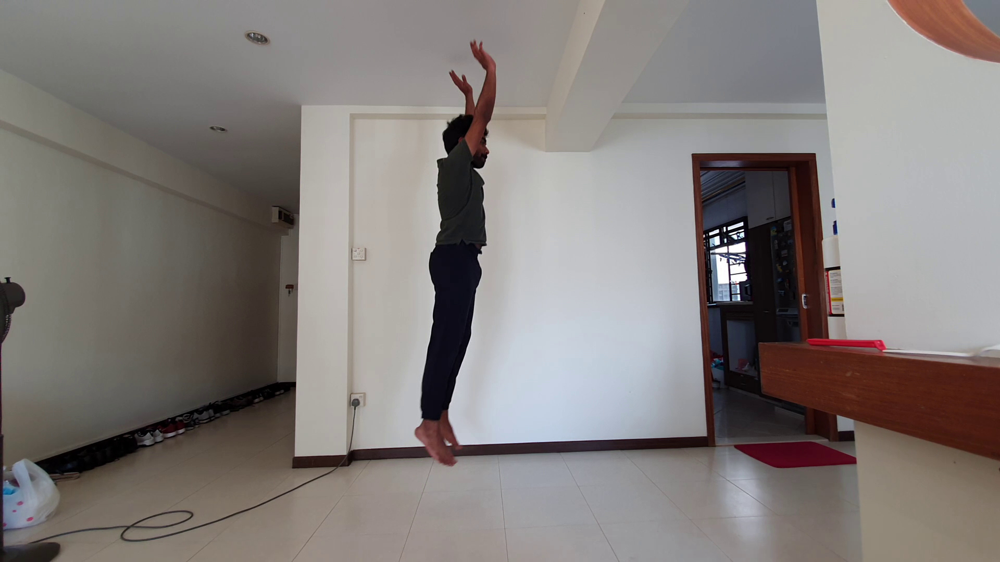

In [11]:
im = load_image(get_image_files(path/"test")[0])
im

In [12]:
learn_inf.predict(get_image_files(path/"test")[-1])

('squat', tensor(2), tensor([4.4779e-04, 7.0105e-04, 9.6915e-01, 2.9696e-02]))

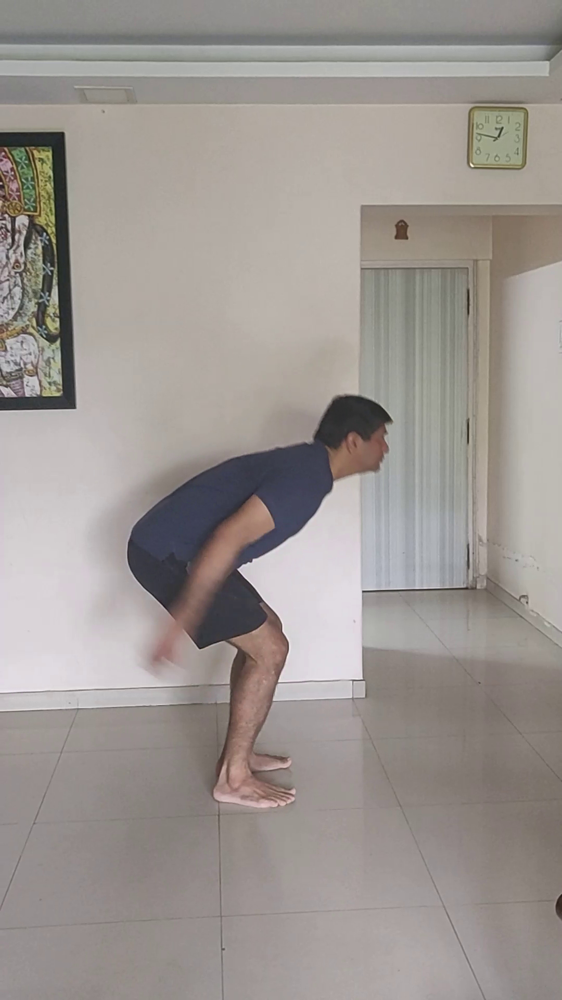

In [13]:
im = load_image(get_image_files(path/"test")[-1])
im

In [14]:
test_dl = learn_inf.dls.test_dl(test_items = get_image_files(path/"test"), 
                                with_labels = True,
                                # get_y = RegexLabeller(pat = r"jump_peak|landing|squat|transition"), 
                                num_workers = 0, 
                                bs = 32
                               )

# When with_labels=True, the labels are picked up by default using get_y=parent_label as set during definition of DataBlock and DataLoaders.
# get_y can't seem to be changed at this stage. So, use this default if images in test folder are arranged like in train folder.
# Otherwise, set with_labels=False and create a labels list separately.

In [15]:
test_preds = learn_inf.get_preds(dl=test_dl)

In [16]:
test_preds

(tensor([[9.7077e-01, 3.2996e-03, 2.0499e-02, 5.4279e-03],
         [9.7553e-01, 5.3758e-03, 1.3313e-02, 5.7829e-03],
         [9.8526e-01, 1.2324e-02, 1.0136e-03, 1.4041e-03],
         ...,
         [7.2913e-04, 4.1234e-01, 3.0940e-01, 2.7752e-01],
         [1.9624e-04, 4.8536e-01, 1.6475e-01, 3.4969e-01],
         [4.4779e-04, 7.0105e-04, 9.6915e-01, 2.9696e-02]]),
 tensor([0, 0, 0,  ..., 3, 3, 3], dtype=torch.int32))

In [17]:
type(test_preds)

tuple

In [18]:
test_preds[0].shape

torch.Size([3273, 4])

In [19]:
test_preds[1].shape

torch.Size([3273])

In [20]:
test_preds_df = pd.DataFrame(columns=["Filename", "Actual Category", "Predicted Category", "% prob jump_peak", "% prob landing", "% prob squat", "% prob transition"])

for i in range(test_preds[0].shape[0]):
    
    test_preds_df.loc[i, "Filename"] = os.path.basename(get_image_files(path/"test")[i])
    test_preds_df.loc[i, "Actual Category"] = learn_inf.dls.vocab[test_preds[1][i]]
    test_preds_df.loc[i, "Predicted Category"] = learn_inf.dls.vocab[np.argmax(test_preds[0][i])]
    test_preds_df.loc[i, ["% prob jump_peak", "% prob landing", "% prob squat", "% prob transition"]] = np.round(test_preds[0][i]*100, 2)

In [21]:
test_preds_df

,Filename,Actual Category,Predicted Category,% prob jump_peak,% prob landing,% prob squat,% prob transition
0,20200918_161843_FRAME_68_jump_peak.jpg,jump_peak,jump_peak,97.08,0.33,2.05,0.54
1,20200918_161843_FRAME_70_jump_peak.jpg,jump_peak,jump_peak,97.55,0.54,1.33,0.58
2,20200918_161843_FRAME_74_jump_peak.jpg,jump_peak,jump_peak,98.53,1.23,0.1,0.14
3,IMG_3510_FRAME_1027_jump_peak.jpg,jump_peak,jump_peak,80.07,8.69,0.57,10.67
4,IMG_3510_FRAME_1257_jump_peak.jpg,jump_peak,jump_peak,96.35,0.38,0.16,3.1
...,...,...,...,...,...,...,...
3268,VID_GC 2_FRAME_49_transition.jpg,transition,squat,0.01,7.26,85.02,7.71
3269,VID_GC 2_FRAME_63_transition.jpg,transition,squat,0.02,39.41,39.84,20.72
3270,VID_GC 2_FRAME_64_transition.jpg,transition,landing,0.07,41.23,30.94,27.75
3271,VID_GC 2_FRAME_65_transition.jpg,transition,landing,0.02,48.54,16.48,34.97


In [22]:
os.makedirs("../inputs_outputs/test_preds_csv", exist_ok=True)
test_preds_df.to_csv(os.path.join("../inputs_outputs/test_preds_csv", "test_preds_"+os.path.splitext(os.path.basename(model_pkl_path))[0]+".csv"), index=False)

## Predictions on Unseen Videos (in *test_real_unseen* folder)

In [1]:
import fastai
print('fastai : version {}'.format(fastai.__version__))

fastai : version 2.0.16


In [2]:
from fastai.vision.all import *
import re

In [3]:
path = Path("../inputs_outputs/datasets_train_test/vjump_dataset")
path.ls()

(#3) [Path('../inputs_outputs/datasets_train_test/vjump_dataset/test'),Path('../inputs_outputs/datasets_train_test/vjump_dataset/test_real_unseen'),Path('../inputs_outputs/datasets_train_test/vjump_dataset/train')]

In [4]:
folder_paths_list = [path_item for path_item in (path/"test_real_unseen").ls() if os.path.splitext(path_item)[1]=='']
folder_paths_list

[Path('../inputs_outputs/datasets_train_test/vjump_dataset/test_real_unseen/IMG_3768'),
 Path('../inputs_outputs/datasets_train_test/vjump_dataset/test_real_unseen/IMG_3769'),
 Path('../inputs_outputs/datasets_train_test/vjump_dataset/test_real_unseen/IMG_3770'),
 Path('../inputs_outputs/datasets_train_test/vjump_dataset/test_real_unseen/VID-20201106-WA0004_2'),
 Path('../inputs_outputs/datasets_train_test/vjump_dataset/test_real_unseen/VID_20201024_200813')]

In [5]:
for vid_folder in folder_paths_list:
    print(len(get_image_files(vid_folder)))

392
371
527
184
258


In [7]:
folder_paths_list[0].name

'IMG_3768'

In [8]:
# verify_images(get_image_files(path/"test_real_unseen"))

In [9]:
# Run this to remove any files in the dataset that fail verification (ie. they're not images).

# failed = verify_images(get_image_files(path/"train"))
# failed.map((path/"train").unlink)

In [10]:
model_pkl_path = "C:/Users/S121741/Documents/Personal/Personal Projects_DATA/1. Fitness AI/w_yrs_poc1/inputs_outputs/models/tf_efficientnet_lite0__v2.2.pkl"
learn_inf = load_learner(model_pkl_path)

In [11]:
learn_inf.dls.vocab

['jump_peak', 'landing', 'squat', 'transition']

In [12]:
learn_inf.predict(get_image_files(path/"test_real_unseen")[0])

('transition', tensor(3), tensor([0.0301, 0.1071, 0.3398, 0.5230]))

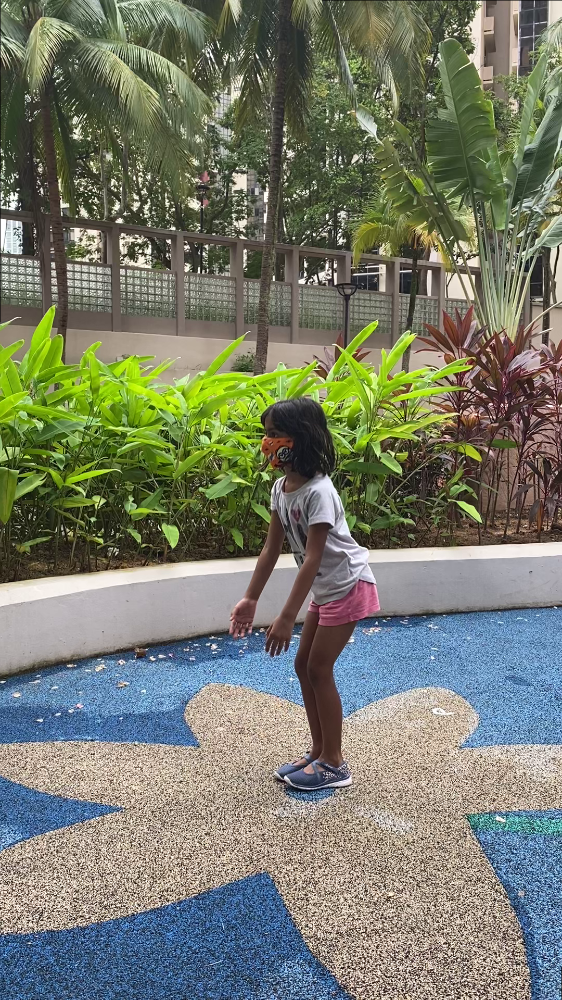

In [13]:
im = load_image(get_image_files(path/"test_real_unseen")[0])
im

In [14]:
learn_inf.predict(get_image_files(path/"test_real_unseen")[-1])

('squat', tensor(2), tensor([0.0096, 0.0601, 0.5852, 0.3451]))

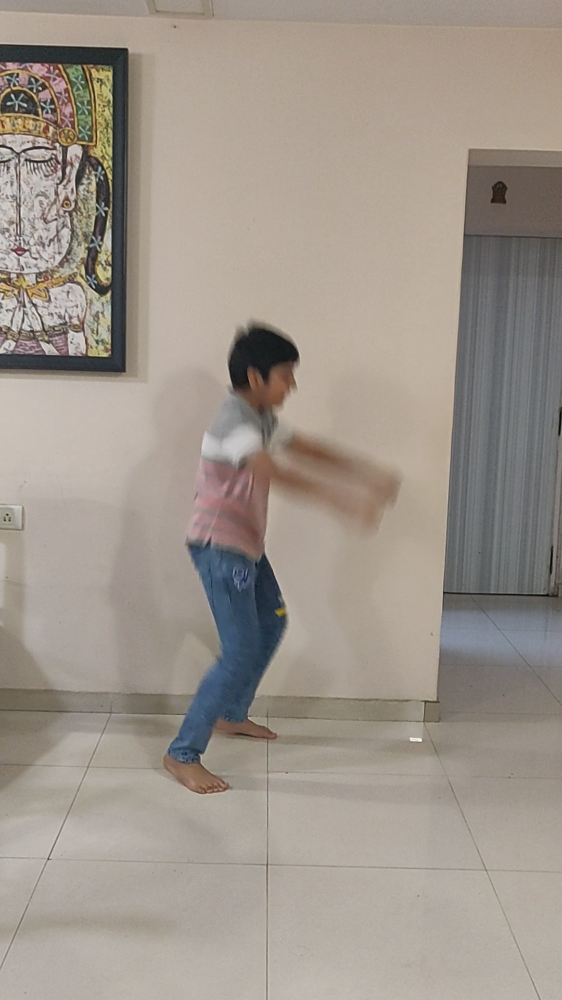

In [15]:
im = load_image(get_image_files(path/"test_real_unseen")[-1])
im

In [16]:
for vid_folder in folder_paths_list:
    
    frames_csv = vid_folder.name + "_FRAME_LABELS.csv"
    frames_csv_path = os.path.join(vid_folder, frames_csv)
    frames_df = pd.read_csv(frames_csv_path)
    
    frames_df_is_valid = True
    # CHECK frames_df VALIDITY HERE
    frames_df.dropna(axis=0, inplace=True)
    frames_df = frames_df.astype("int64")
    
    if frames_df_is_valid:
        
        test_preds_list = [None]*len(frames_df)
        
        for index, row in frames_df.iterrows():
            
            test_preds_list[index] = {}
            
            if row["squat"] == 1:
                test_preds_list[index]["Actual Category"] = "squat"
            elif row["jump_peak"] == 1:
                test_preds_list[index]["Actual Category"] = "jump_peak"
            elif row["landing"] == 1:
                test_preds_list[index]["Actual Category"] = "landing"
            # else:
            elif (row["squat"] == 0 and row["jump_peak"] == 0 and row["landing"] == 0):
                test_preds_list[index]["Actual Category"] = "transition"
                
        test_dl = learn_inf.dls.test_dl(test_items = get_image_files(vid_folder), 
                                with_labels = False,
                                # get_y = RegexLabeller(pat = r"jump_peak|landing|squat|transition"), 
                                num_workers = 0, 
                                bs = 32
                               )
        # When with_labels=True, the labels are picked up by default using get_y=parent_label as set during definition of DataBlock and DataLoaders.
        # get_y can't seem to be changed at this stage. So, use this default if images in test folder are arranged like in train folder.
        # Otherwise, set with_labels=False and create a labels list separately.
        
        test_preds = learn_inf.get_preds(dl=test_dl)
    
        for i in range(test_preds[0].shape[0]):
            
            frame = int(re.findall(r"FRAME_(\d*)", get_image_files(vid_folder)[i].name)[0])
            
            test_preds_list[frame - 1]["Filename"] = get_image_files(vid_folder)[i].name
            test_preds_list[frame - 1]["Predicted Category"] = learn_inf.dls.vocab[np.argmax(test_preds[0][i])]
            
            for prob in test_preds[0][i]:
                test_preds_list[frame - 1]["% prob jump_peak"] = np.round(test_preds[0][i][0].item() * 100, 2)
                test_preds_list[frame - 1]["% prob landing"] = np.round(test_preds[0][i][1].item() * 100, 2)
                test_preds_list[frame - 1]["% prob squat"] = np.round(test_preds[0][i][2].item() * 100, 2)
                test_preds_list[frame - 1]["% prob transition"] = np.round(test_preds[0][i][3].item() * 100, 2)
            
        test_preds_df = pd.DataFrame.from_records(test_preds_list)
        
        test_preds_df = test_preds_df[["Filename", "Actual Category", "Predicted Category", "% prob jump_peak", "% prob landing", "% prob squat", "% prob transition"]]
    
        test_preds_df.to_csv(os.path.join(vid_folder, vid_folder.name+"_PREDS_"+os.path.splitext(os.path.basename(model_pkl_path))[0]+".csv"), index=False)
        
    else:
        pass